In [1]:
import sys
sys.path.append('../')

In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [3]:
from src.data_processing.io.image import Image

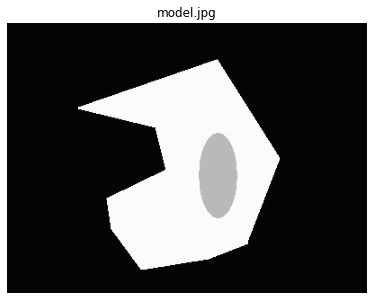

In [4]:
model = Image.from_file("../data/model.jpg")
model.plot()

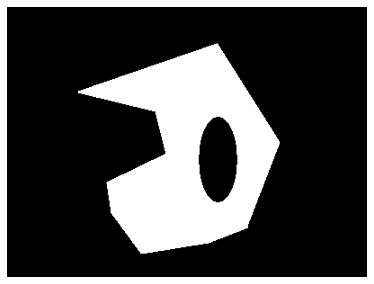

In [5]:
threash = model.threashold(200)
threash.plot()

In [6]:
from src.data_processing.analysis import hessian, extract_range

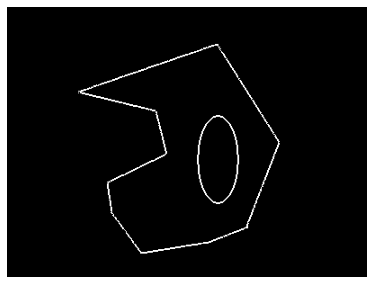

In [141]:
extract_range(Image(gradient[0][0] + gradient[1][1]), 180, 250).plot()

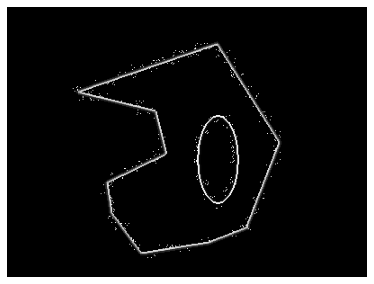

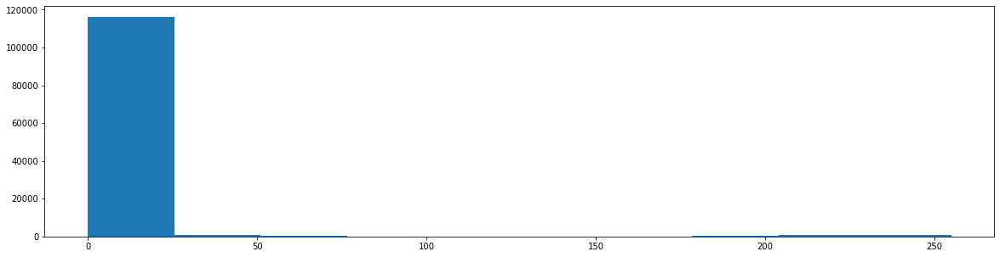

In [121]:
gradient = hessian(model.img)
Image(gradient[0][0] + gradient[1][1]).plot()
Image(gradient[0][0] + gradient[1][1]).histogram()


In [124]:
tmp = (gradient[0][0] + gradient[1][1]).flatten()
tmp = [x for x in tmp if x != 0]

In [132]:
def gradient_edge(image, start, end):
    gradient = hessian(image.img)
    grad_x = Image(gradient[0][0]).threashold(start, end)
    grad_y = Image(gradient[1][1]).threashold(start, end)
    img = Image(grad_x.img + grad_y.img)
    img.plot()
    return img

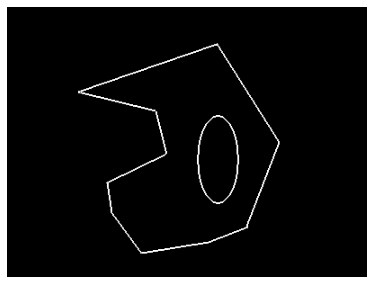

In [8]:
gradient_edge(threash, 181, 222)

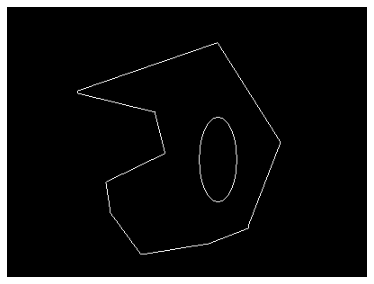

In [9]:
threash.laplacian(0).plot()

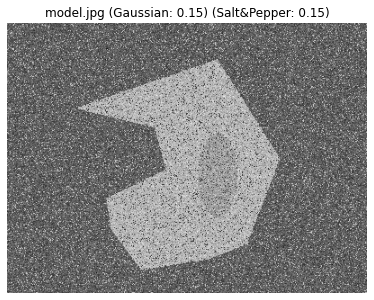

In [70]:
noised = model.noise(0.15, "gauss").noise(0.15, "sp")
noised.normalize()
noised.plot()

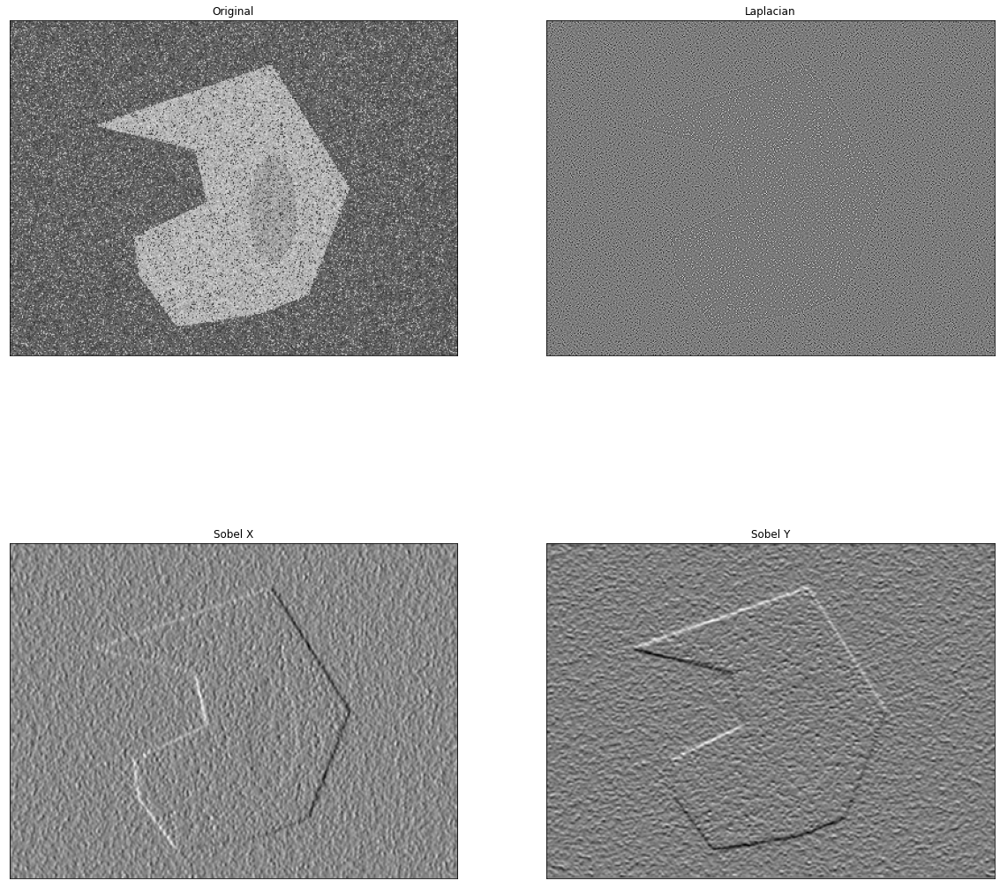

In [155]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = noised.img
laplacian = cv.Laplacian(img,cv.CV_64F)
sobelx = cv.Sobel(img,cv.CV_64F,1,0,ksize=5)
sobely = cv.Sobel(img,cv.CV_64F,0,1,ksize=5)

plt.figure(figsize=(20, 20))
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.show()

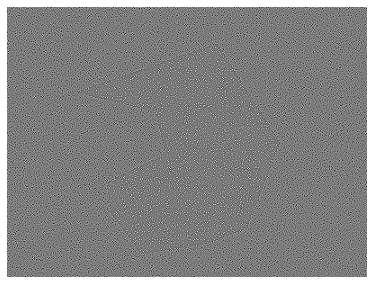

In [157]:
lap = Image(laplacian)
lap.plot()

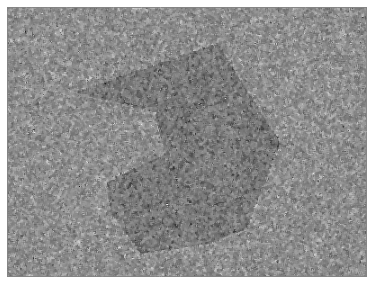

In [187]:
lap2 = median_filter(lap, 3)
lap2.plot()

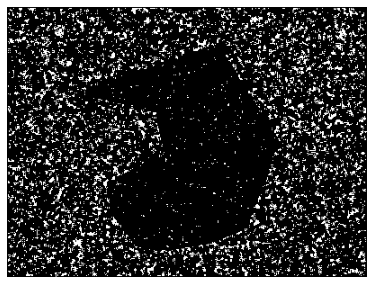

In [218]:
lap3 = lap2.threashold(100)
lap3.plot()

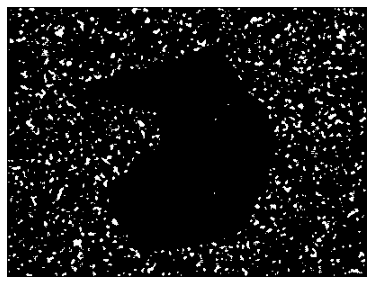

In [219]:
lap4 = median_filter(lap3, 3)
lap4.plot()

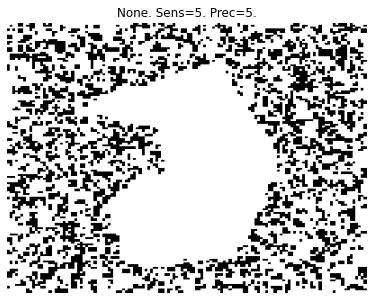

In [206]:
lap5 = histogram_segmentation(lap4, 0, 5, 5)
lap5.plot()

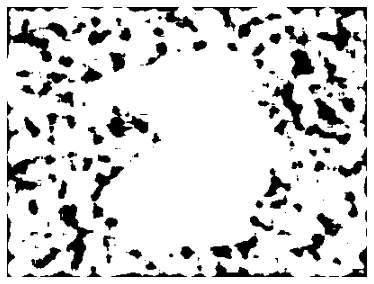

In [216]:
lap6 = median_filter(lap5, 11)
lap6.plot()

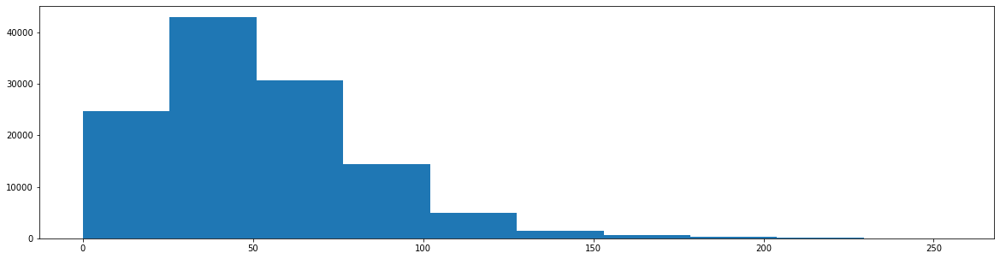

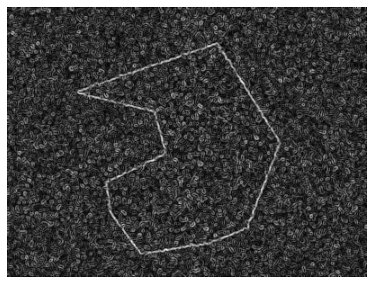

In [85]:
res = Image(np.hypot(sobelx, sobely))
res.normalize()
res.histogram()
res.plot()

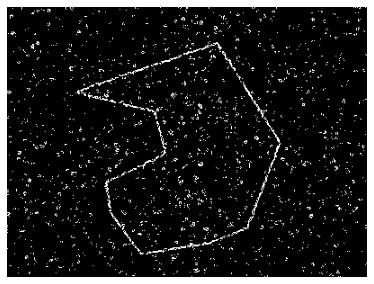

In [97]:
res2 = extract_range(res, 110, 190)
res2.plot()

In [105]:
from src.data_processing.proc.filters import median_filter, mean_filter

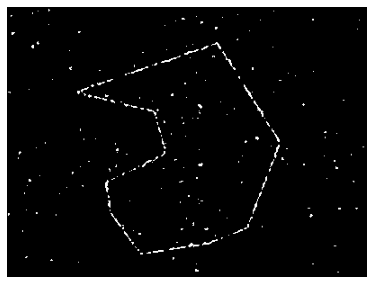

In [107]:
res3 = median_filter(res2, 3)
res3.plot()

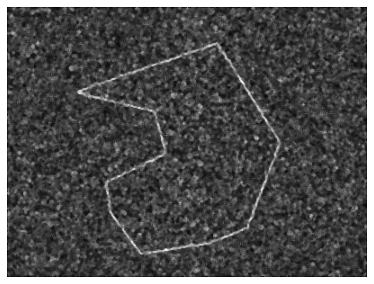

In [112]:
res4 = median_filter(res, 3)
res4.plot()

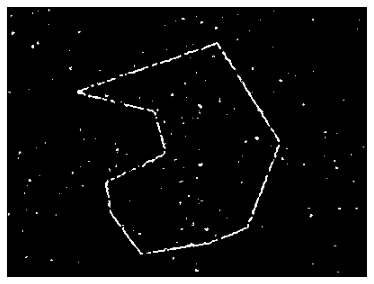

In [113]:
res5 = extract_range(res4, 110, 190)
res5.plot()

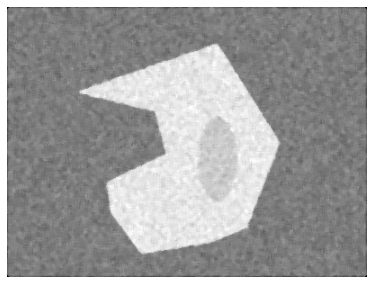

In [115]:
denoised = median_filter(noised, 5)
denoised.plot()

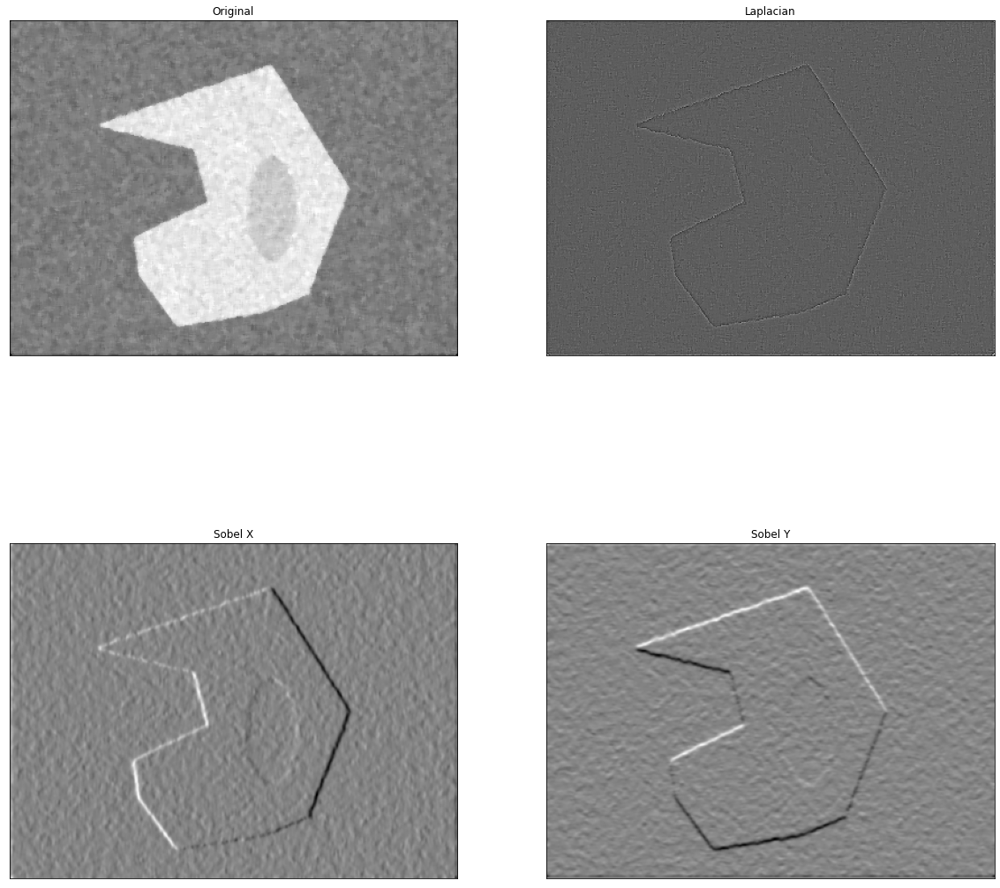

In [116]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = denoised.img
laplacian = cv.Laplacian(img,cv.CV_64F)
sobelx = cv.Sobel(img,cv.CV_64F,1,0,ksize=5)
sobely = cv.Sobel(img,cv.CV_64F,0,1,ksize=5)

plt.figure(figsize=(20, 20))
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.show()

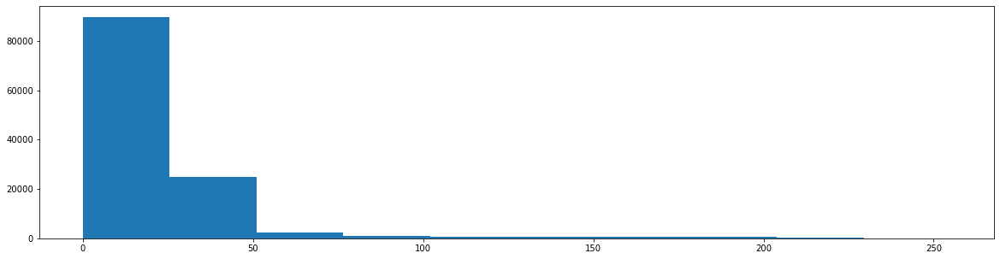

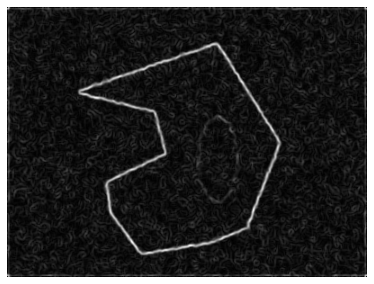

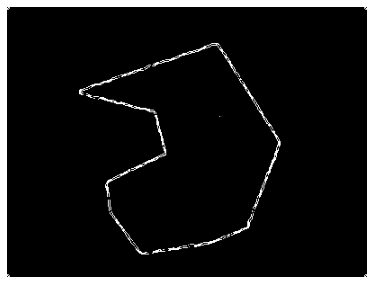

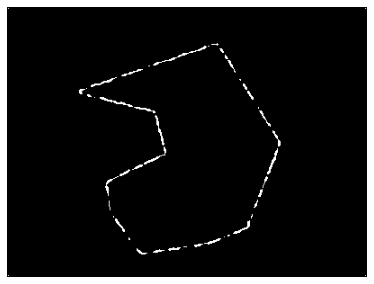

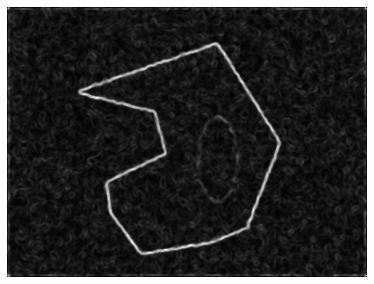

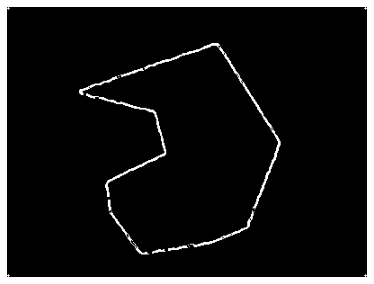

In [118]:
res = Image(np.hypot(sobelx, sobely))
res.normalize()
res.histogram()
res.plot()

res2 = extract_range(res, 110, 190)
res2.plot()

res3 = median_filter(res2, 3)
res3.plot()

res4 = median_filter(res, 3)
res4.plot()

res5 = extract_range(res4, 110, 190)
res5.plot()

In [148]:
from src.data_processing.proc.conour import histogram_segmentation

In [152]:
noised = model.noise(0.15, "gauss").noise(0.15, "sp")

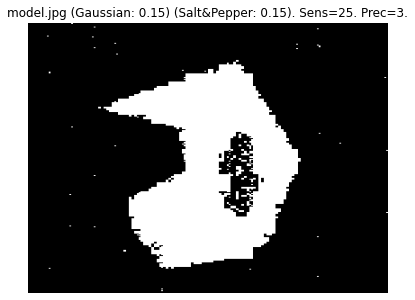

In [153]:
adapt_threash = histogram_segmentation(noised, 220, 25, 3)
adapt_threash.plot()

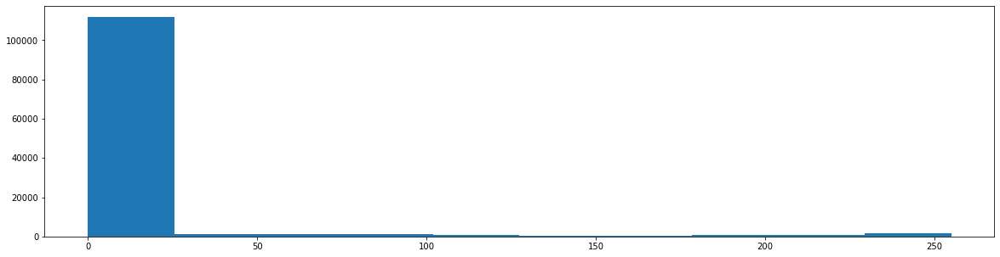

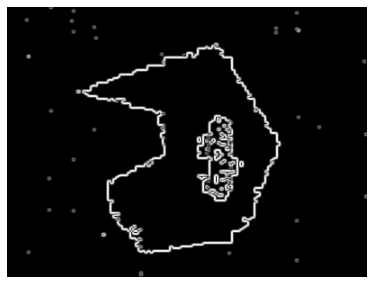

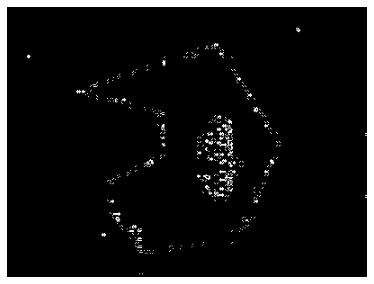

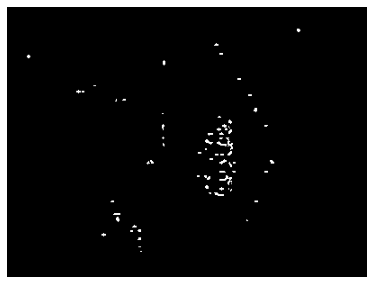

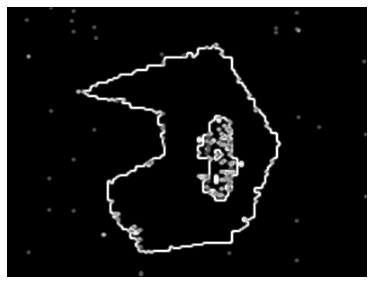

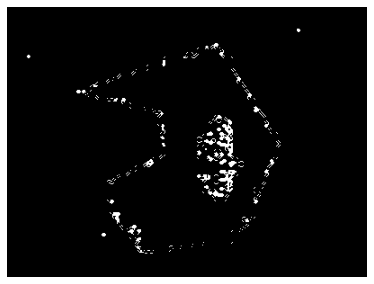

In [154]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = adapt_threash.img
laplacian = cv.Laplacian(img,cv.CV_64F)
sobelx = cv.Sobel(img,cv.CV_64F,1,0,ksize=5)
sobely = cv.Sobel(img,cv.CV_64F,0,1,ksize=5)

res = Image(np.hypot(sobelx, sobely))
res.normalize()
res.histogram()
res.plot()

res2 = extract_range(res, 110, 190)
res2.plot()

res3 = median_filter(res2, 3)
res3.plot()

res4 = median_filter(res, 3)
res4.plot()

res5 = extract_range(res4, 110, 190)
res5.plot()

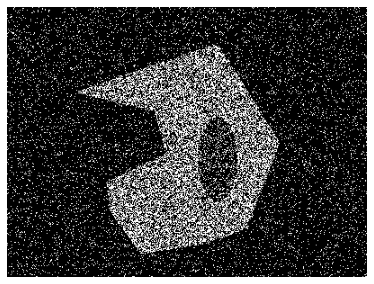

In [145]:
glob_threash = noised.threashold(180, 220)
glob_threash.plot()

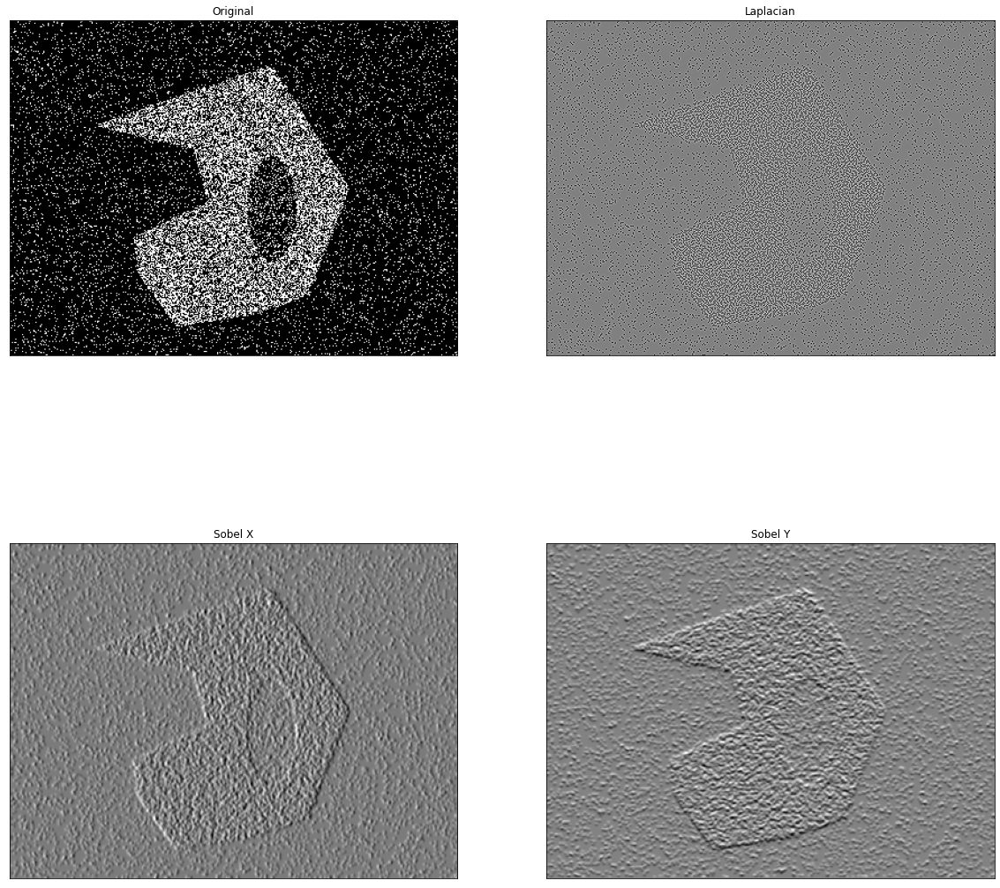

In [146]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
img = glob_threash.img
laplacian = cv.Laplacian(img,cv.CV_64F)
sobelx = cv.Sobel(img,cv.CV_64F,1,0,ksize=5)
sobely = cv.Sobel(img,cv.CV_64F,0,1,ksize=5)

plt.figure(figsize=(20, 20))
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.show()

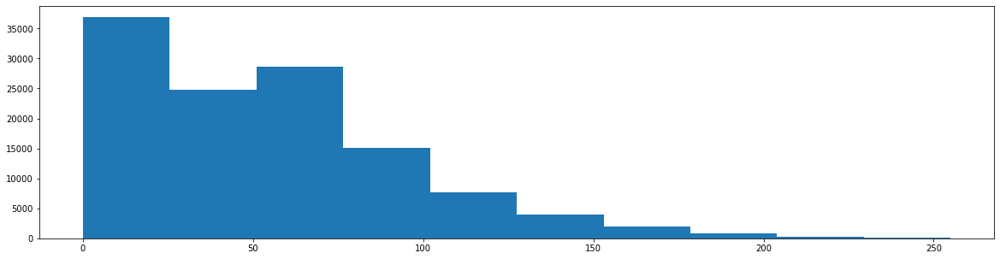

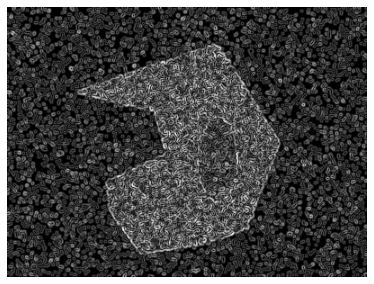

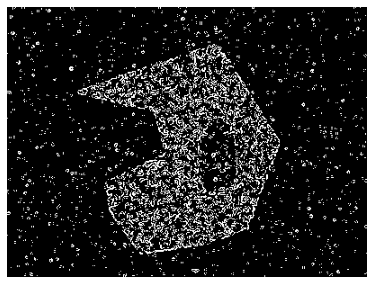

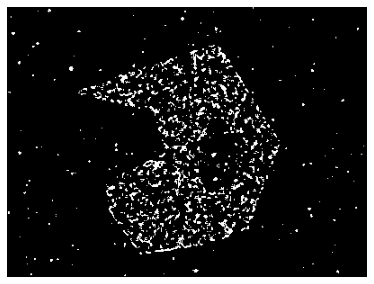

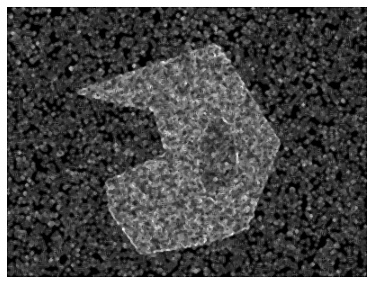

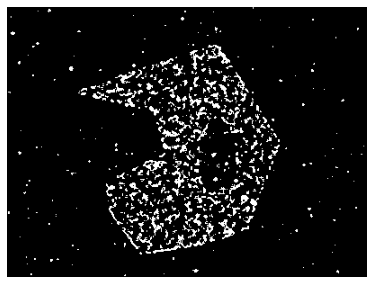

In [147]:
res = Image(np.hypot(sobelx, sobely))
res.normalize()
res.histogram()
res.plot()

res2 = extract_range(res, 110, 190)
res2.plot()

res3 = median_filter(res2, 3)
res3.plot()

res4 = median_filter(res, 3)
res4.plot()

res5 = extract_range(res4, 110, 190)
res5.plot()